In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM


### Anomaly Detection

In [3]:
data = pd.read_csv("housing_price.csv",encoding='ansi')
data


C:\Users\Admin\AppData\Local\Temp\ipykernel_20484\1395358988.py:1: DtypeWarning: Columns (1,11,12,14) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("housing_price.csv",encoding='ansi')


,url,id,Lng,Lat,Cid,tradeTime,DOM,followers,totalPrice,price,...,buildingType,constructionTime,renovationCondition,buildingStructure,ladderRatio,elevator,fiveYearsProperty,subway,district,communityAverage
0,https://bj.lianjia.com/chengjiao/101084782030....,101084782030,116.475489,40.019520,1111027376244,2016-08-09,1464.0,106,415.0,31680,...,1.0,2005,3,6,0.217,1.0,0.0,1.0,7,56021.0
1,https://bj.lianjia.com/chengjiao/101086012217....,101086012217,116.453917,39.881534,1111027381879,2016-07-28,903.0,126,575.0,43436,...,1.0,2004,4,6,0.667,1.0,1.0,0.0,7,71539.0
2,https://bj.lianjia.com/chengjiao/101086041636....,101086041636,116.561978,39.877145,1111040862969,2016-12-11,1271.0,48,1030.0,52021,...,4.0,2005,3,6,0.500,1.0,0.0,0.0,7,48160.0
3,https://bj.lianjia.com/chengjiao/101086406841....,101086406841,116.438010,40.076114,1111043185817,2016-09-30,965.0,138,297.5,22202,...,1.0,2008,1,6,0.273,1.0,0.0,0.0,6,51238.0
4,https://bj.lianjia.com/chengjiao/101086920653....,101086920653,116.428392,39.886229,1111027381174,2016-08-28,927.0,286,392.0,48396,...,4.0,1960,2,2,0.333,0.0,1.0,1.0,1,62588.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318846,https://bj.lianjia.com/chengjiao/BJYZ92311192....,BJYZ92311192,116.546899,39.755236,1111027377053,2016-06-10,1.0,8,350.0,20580,...,4.0,2003,1,6,0.333,0.0,1.0,0.0,3,36545.0
318847,https://bj.lianjia.com/chengjiao/BJYZ92320171....,BJYZ92320171,116.497474,39.810115,1111027377957,2016-06-10,NaN,1,108.8,31006,...,1.0,2009,1,6,0.222,1.0,0.0,1.0,3,54282.0
318848,https://bj.lianjia.com/chengjiao/BJYZ92324217....,BJYZ92324217,116.497256,39.804081,1111027380056,2016-06-05,1.0,2,359.0,35138,...,4.0,2000,3,6,0.500,1.0,1.0,0.0,3,46927.0
318849,https://bj.lianjia.com/chengjiao/BJYZ92333313....,BJYZ92333313,116.501794,39.799347,1111027377054,2016-06-12,NaN,4,720.0,40373,...,4.0,2003,4,2,0.500,0.0,1.0,0.0,3,54842.0


Оюработка данных

In [4]:
data.drop_duplicates()
mas=[i for i in data.columns if data[i].dtypes=='float64' or data[i].dtypes=='int64']
for i in mas:
    if data[i].isnull().sum() > 0:
        data[i] = data[i].fillna(0)


In [5]:
data[i].isna().any()


False

Isolation Forest

In [6]:
import plotly.express as px

# plotting scattered graph
fig = px.scatter([i for i in range(len(data['totalPrice']))],
                 y=data['totalPrice'])
fig.show()


Возьмём переменную "Общая стоимость" для обнаружения аномалии. На визуализации видим, что есть некоторые выбросы.

In [7]:
x1 = data[['totalPrice']]



Определение и подгонка модели

In [8]:
# Параметр contamation(загрязнение) определяет приблизительную оценку процента выброса наших данных. Из 1010 строк у нас 21 аномалия. Это примерно 2%.
model = IsolationForest(n_estimators=100, max_samples='auto',
                        contamination=float(0.001), max_features=1.0)
model.fit(x1[['totalPrice']])  # обучаем модель


c:\Python\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



IsolationForest(contamination=0.001)

In [9]:
# Вызываем decision_function() функцию обученной модели и передаём значения в столбец "scores"
x1['scores'] = model.decision_function(x1[['totalPrice']])
# Вызываем predict() функцию обученной модели и передаём значения в столбец "anomaly"
x1['anomaly'] = model.predict(x1[['totalPrice']])
x1


C:\Users\Admin\AppData\Local\Temp\ipykernel_20484\3562936474.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Admin\AppData\Local\Temp\ipykernel_20484\3562936474.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,totalPrice,scores,anomaly
0,415.0,0.369794,1
1,575.0,0.306721,1
2,1030.0,0.145440,1
3,297.5,0.389396,1
4,392.0,0.370226,1
...,...,...,...
318846,350.0,0.387258,1
318847,108.8,0.287990,1
318848,359.0,0.381189,1
318849,720.0,0.257337,1


In [13]:
anomaly = x1.loc[x1['anomaly'] == -1]
anomaly_index = list(anomaly.index)
print(anomaly)


        totalPrice    scores  anomaly
167         2200.0 -0.002779       -1
252         2250.0 -0.005009       -1
315         3305.0 -0.011174       -1
352         2560.0 -0.007806       -1
399         2690.0 -0.011174       -1
...            ...       ...      ...
313996      2950.0 -0.011174       -1
314494      3840.0 -0.011736       -1
314788      2500.0 -0.007806       -1
316141      2100.0 -0.002223       -1
316564      2450.0 -0.007806       -1

[307 rows x 3 columns]


In [14]:
print("Процент точности", 100 *
      list(x1['anomaly']).count(-1)/307)  # рассчитываем точность модели, найдя, сколько выбросов обнаружила модель, деленную на количество выбросов, присутствующих в данных.


Процент точности 100.0


SVM(Support Vector Machine)

In [16]:
df = data.head(10000)
df

,url,id,Lng,Lat,Cid,tradeTime,DOM,followers,totalPrice,price,...,buildingType,constructionTime,renovationCondition,buildingStructure,ladderRatio,elevator,fiveYearsProperty,subway,district,communityAverage
0,https://bj.lianjia.com/chengjiao/101084782030....,101084782030,116.475489,40.019520,1111027376244,2016-08-09,1464.0,106,415.0,31680,...,1.0,2005,3,6,0.217,1.0,0.0,1.0,7,56021.0
1,https://bj.lianjia.com/chengjiao/101086012217....,101086012217,116.453917,39.881534,1111027381879,2016-07-28,903.0,126,575.0,43436,...,1.0,2004,4,6,0.667,1.0,1.0,0.0,7,71539.0
2,https://bj.lianjia.com/chengjiao/101086041636....,101086041636,116.561978,39.877145,1111040862969,2016-12-11,1271.0,48,1030.0,52021,...,4.0,2005,3,6,0.500,1.0,0.0,0.0,7,48160.0
3,https://bj.lianjia.com/chengjiao/101086406841....,101086406841,116.438010,40.076114,1111043185817,2016-09-30,965.0,138,297.5,22202,...,1.0,2008,1,6,0.273,1.0,0.0,0.0,6,51238.0
4,https://bj.lianjia.com/chengjiao/101086920653....,101086920653,116.428392,39.886229,1111027381174,2016-08-28,927.0,286,392.0,48396,...,4.0,1960,2,2,0.333,0.0,1.0,1.0,1,62588.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,https://bj.lianjia.com/chengjiao/101092292781....,101092292781,116.373014,39.859478,1111027374270,2016-08-29,92.0,48,285.0,43962,...,1.0,1998,3,6,0.250,1.0,1.0,1.0,2,59797.0
9996,https://bj.lianjia.com/chengjiao/101092292797....,101092292797,116.374708,39.854229,1111027377509,2016-07-18,50.0,12,199.0,44351,...,4.0,1998,3,2,0.333,0.0,0.0,1.0,2,56242.0
9997,https://bj.lianjia.com/chengjiao/101092292798....,101092292798,116.425063,40.044097,1111027378336,2016-08-08,70.0,26,285.0,44967,...,3.0,2011,4,6,0.182,1.0,0.0,1.0,7,52870.0
9998,https://bj.lianjia.com/chengjiao/101092292943....,101092292943,116.509448,39.874885,1111027375889,2016-06-26,27.0,4,590.0,48777,...,3.0,2015,1,6,0.667,1.0,0.0,1.0,7,66300.0


In [18]:
df1 = df[["followers", "totalPrice"]]
df1.describe()


,followers,totalPrice
count,10000.00000,10000.000000
mean,47.69960,460.016380
std,51.10524,297.785092
min,0.00000,27.400000
25%,18.00000,275.000000
50%,33.00000,388.000000
75%,59.00000,550.000000
max,1000.00000,4100.000000


In [63]:
# параметр nu показывает, какой процент даных аномален.
model = OneClassSVM(kernel='rbf', gamma=0.0001, nu=0.05).fit(df1)
y_pred = model.predict(df1)


In [64]:
anomaly_values = df1.iloc[np.where(y_pred == -1)]
anomaly_values


,followers,totalPrice
1,126,575.0
4,286,392.0
8,218,134.0
20,20,1950.0
21,276,176.0
...,...,...
9873,566,343.0
9897,90,1100.0
9898,0,648.0
9927,7,1050.0


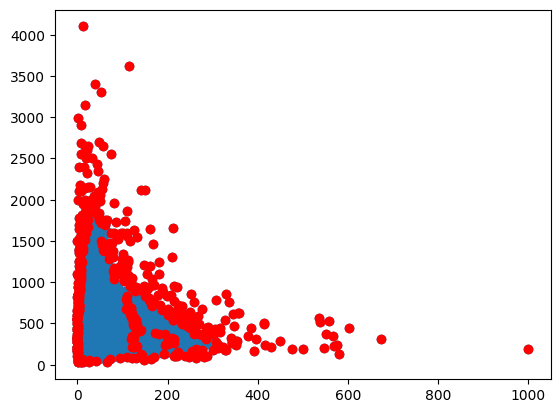

In [65]:
plt.scatter(df1["followers"], df1["totalPrice"])
plt.scatter(anomaly_values["followers"],anomaly_values["totalPrice"],c="r")